In [132]:
import numpy as np
import math as m
import os
import scipy
import scipy.misc as misc
import PIL.Image
import PIL.ImageDraw
import random

from sklearn.cluster import KMeans
from matplotlib import pyplot as plt
from numpy.linalg import norm

import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
import os
import cv2 
import random
from PIL import Image
import pandas as pd
from sklearn.preprocessing import StandardScaler
import imageio
import scipy.misc
import tensorflow as tf
from matplotlib.colors import LinearSegmentedColormap

In [133]:
def load_image(img_file, target_size=(224,224)):
    X = np.zeros((1, *target_size, 3))
    X[0, ] = np.asarray(tf.keras.preprocessing.image.load_img(
        img_file, 
        target_size=target_size)
    )
    X = tf.keras.applications.mobilenet.preprocess_input(X)
    return X

def ensure_folder_exists(folder):
    if not os.path.exists(folder):
        os.makedirs(folder)

In [134]:
def processImage(imagePath, model):
    im = load_image(imagePath)
    f = model.predict(im)[0]
    return f

In [135]:
def normalise(train, p):
    min_d = np.min(train)
    max_d = np.max(train)
    normalised_p = (p-min_d)/(max_d - min_d)
    return normalised_p

def denormalise(train, p):
    min_d = np.min(train)
    max_d = np.max(train)
    denormalised_p = p * (max_d - min_d) + min_d
    return denormalised_p

In [136]:
# Return the (g,h) index of the BMU in the grid
def find_BMU(SOM,x):
    distSq = (np.square(SOM - x)).sum(axis=2)
    return np.unravel_index(np.argmin(distSq, axis=None), distSq.shape)

# Update the weights of the SOM cells when given a single training example
# and the model parameters along with BMU coordinates as a tuple
def update_weights(SOM, train_ex, learn_rate, radius_sq, 
                   BMU_coord, step=3):
    g, h = BMU_coord
    #if radius is close to zero then only BMU is changed
    if radius_sq < 1e-3:
        SOM[g,h,:] += learn_rate * (train_ex - SOM[g,h,:])
        return SOM
    # Change all cells in a small neighborhood of BMU
    for i in range(max(0, g-step), min(SOM.shape[0], g+step)):
        for j in range(max(0, h-step), min(SOM.shape[1], h+step)):
            dist_sq = np.square(i - g) + np.square(j - h)
            dist_func = np.exp(-dist_sq / 2 / radius_sq)
            SOM[i,j,:] += learn_rate * dist_func * (train_ex - SOM[i,j,:])   
    return SOM    

# Main routine for training an SOM. It requires an initialized SOM grid
# or a partially trained grid as parameter
def train_SOM(SOM, train_data, learn_rate = .1, radius_sq = 1, 
             lr_decay = .1, radius_decay = .1, epochs = 10):    
    learn_rate_0 = learn_rate
    radius_0 = radius_sq
    for epoch in np.arange(0, epochs):
        rand.shuffle(train_data)      
        for train_ex in train_data:
            g, h = find_BMU(SOM, train_ex)
            SOM = update_weights(SOM, train_ex, 
                                 learn_rate, radius_sq, (g,h))
        # Update learning rate and radius
        learn_rate = learn_rate_0 * np.exp(-epoch * lr_decay)
        radius_sq = radius_0 * np.exp(-epoch * radius_decay)            
    return SOM

In [137]:
import scipy
def calculateQE(SOM,data):
    sumSqDist = 0
    for d in data:
        g,h = find_BMU(SOM, d)
        v1 = SOM[g,h]
        v2 = d
        sumSqDist += scipy.spatial.distance.cdist([v1],[v2],'sqeuclidean')[0][0]
    QE = sumSqDist/len(data)
    return QE

In [138]:
# Return the (g,h) index of the BMU in the grid
def find_BMU_2(SOM,x):
    distSq = (np.square(SOM - x)).sum(axis=2)
    return np.unravel_index(np.argpartition(distSq, 2, axis=None)[2], distSq.shape)

In [139]:
def calculateTE(SOM,data):
    failed = 0
    for d in data:
        g1,h1 = find_BMU(SOM,d)
        g2,h2 = find_BMU_2(SOM,d)
        dist = scipy.spatial.distance.cityblock([g1,h1], [g2,h2])
        if dist>1:
            failed+=1
    return failed/len(data)

In [140]:
import sklearn

def euclidean(a, b):
    return np.linalg.norm(a-b)

def u_matrix(lattice):

    X, Y, Z = lattice.shape
    u_values = np.empty((X,Y), dtype=np.float64)

    for y in range(Y):
        for x in range(X):
            current = lattice[x,y]
            dist = 0
            num_neigh = 0
            # left
            if x-1 >= 0:
                #middle
                vec = lattice[x-1,y]
                dist += euclidean(current, vec)
                num_neigh += 1
                if y - 1 >= 0:
                    #sup
                    vec = lattice[x-1, y-1]
                    dist += euclidean(current, vec)
                    num_neigh += 1
                if y + 1 < Y:
                    # down
                    vec = lattice[x-1,y+1]
                    dist += euclidean(current, vec)
                    num_neigh += 1
            # middle
            if y - 1 >= 0:
                # up
                vec = lattice[x,y-1]
                dist += euclidean(current, vec)
                num_neigh += 1
            # down
            if y + 1 < Y:
                vec = lattice[x,y+1]
                dist += euclidean(current, vec)
                num_neigh += 1
            # right
            if x + 1 < X:
                # middle
                vec = lattice[x+1,y]
                dist += euclidean(current, vec)
                num_neigh += 1
                if y - 1 >= 0:
                    #up
                    vec = lattice[x+1,y-1]
                    dist += euclidean(current, vec)
                    num_neigh += 1
                if y + 1 < lattice.shape[1]:
                    # down
                    vec = lattice[x+1,y+1]
                    dist += euclidean(current, vec)
                    num_neigh += 1
            u_values[x,y] = dist / num_neigh
    u_values = (u_values - 1) * -1
    return u_values

In [141]:
def activate(train_data, SOM, p):
    normalP = normalise(train_data, p)
    activatedSOM = np.array([[euclidean(normalP, c) for c in r] for r in SOM])
    normalisedActivatedSOM = normalise(activatedSOM, activatedSOM)
    activatedSOM = (normalisedActivatedSOM -1)*(-1)
    return activatedSOM

### 1.0 Train a SOM with your own collection of images. Also play around with the size of the SOM and the other training parameters to find a good setting

In [142]:
model = tf.keras.applications.mobilenet.MobileNet(
# The 3 is the three dimensionsa of the input: r,g,b.
  input_shape=(224, 224, 3), 
  include_top=False, 
  pooling='avg'
)

In [143]:
momaFiles = os.listdir('Input_Images')
momaFiles = momaFiles[:300]

In [144]:
features = []
for m in momaFiles:
    path = os.path.join('Input_Images', m)
    f = processImage(path, model)
    features.append(f)

1/1 [==============================] - 0s 55ms/step


In [145]:
featureImagePairs = []
for i in range(len(features)):
    featureImage = {}
    featureImage['image'] = momaFiles[i]
    featureImage['feature'] = features[i]
    featureImagePairs.append(featureImage)

In [146]:
featureImagePairs[0]

{'image': '1.jpg',
 'feature': array([0.27969754, 1.2918435 , 0.82733744, ..., 0.05108447, 0.00511587,
        0.05542929], dtype=float32)}

In [147]:
# Dimensions of the SOM grid
m = 10
n = 10
# Number of training examples
n_x = 1000
rand = np.random.RandomState(0)
# Initialize the training data
train_data = features

# Normalised Training Data
n_train_data = normalise(train_data, train_data)

# Initialize the SOM randomly
SOM = rand.uniform(0, 1, (m, n, len(train_data[0])))

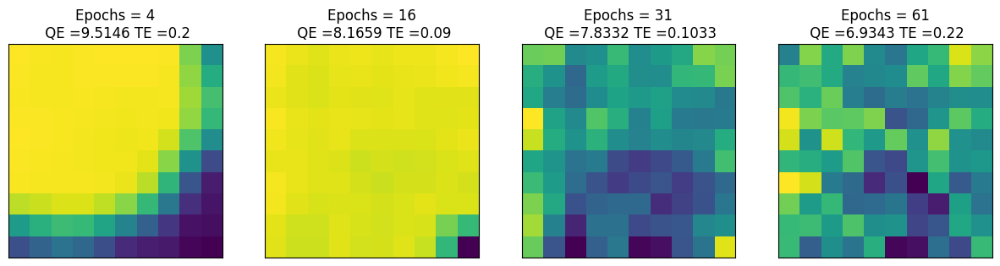

In [148]:
fig, ax = plt.subplots(
    nrows=1, ncols=4, figsize=(15, 3.5), 
    subplot_kw=dict(xticks=[], yticks=[]))
total_epochs = 0
SOMS = []
for epochs, i in zip([4, 12, 15, 30], range(0,4)):
    total_epochs += epochs
    SOM = train_SOM(SOM, n_train_data, learn_rate = .1, radius_sq = 2, epochs = epochs)
    SOMS.append(SOM)
    QE = round(calculateQE(SOM, n_train_data), 4)
    TE = round(calculateTE(SOM, n_train_data), 4)
    
    ax[i].imshow(u_matrix(SOM))
    ax[i].title.set_text('Epochs = ' + str(total_epochs) + '\n QE =' + str(QE) + ' TE =' + str(TE))

In [149]:
SOMimages = []
for i in range(len(SOM)):
    row = []
    for j in range(len(SOM[0])):
        row.append([])
    SOMimages.append(row)

In [150]:
for fi in featureImagePairs:
    g,h = find_BMU(SOM, normalise(train_data, fi['feature']))
    SOMimages[g][h].append(fi)

In [151]:
SOMimages[0][0]

[{'image': '16.jpg',
  'feature': array([0.        , 0.32611692, 0.4763522 , ..., 0.        , 0.02662233,
         0.        ], dtype=float32)},
 {'image': '165.jpg',
  'feature': array([0.0189141 , 0.07231188, 0.4527117 , ..., 0.1648173 , 0.        ,
         0.        ], dtype=float32)},
 {'image': '21.jpg',
  'feature': array([0.02052931, 1.2052346 , 0.1916174 , ..., 0.16787645, 0.6226079 ,
         0.07735036], dtype=float32)},
 {'image': '226.jpg',
  'feature': array([0.12012568, 0.4584601 , 1.0007205 , ..., 2.260124  , 0.19187418,
         0.        ], dtype=float32)},
 {'image': '255.jpg',
  'feature': array([0.        , 0.40127525, 0.61362463, ..., 0.39199176, 0.61221206,
         0.        ], dtype=float32)},
 {'image': '5.jpg',
  'feature': array([0.01291112, 0.07743617, 0.10483018, ..., 1.8156486 , 0.15642722,
         0.        ], dtype=float32)},
 {'image': '77.jpg',
  'feature': array([0.03172332, 0.31302804, 0.9177327 , ..., 0.07203868, 1.3356607 ,
         0.        ], 

In [152]:
[[len(c) for c in r] for r in SOMimages]

[[8, 7, 7, 0, 7, 6, 4, 9, 2, 8],
 [3, 2, 3, 4, 4, 2, 0, 3, 1, 4],
 [5, 2, 0, 3, 3, 2, 3, 4, 3, 8],
 [7, 3, 1, 4, 0, 3, 3, 2, 0, 1],
 [5, 5, 0, 9, 4, 0, 5, 0, 3, 6],
 [6, 2, 3, 0, 2, 2, 4, 0, 3, 4],
 [0, 0, 3, 1, 2, 1, 2, 0, 2, 4],
 [6, 4, 1, 4, 6, 1, 2, 3, 0, 3],
 [4, 1, 0, 0, 1, 0, 1, 1, 0, 5],
 [6, 5, 0, 8, 1, 2, 4, 3, 5, 4]]

In [153]:
from scipy import spatial

imageGrid = []
for g in range(len(SOMimages)):
    row = SOMimages[g]
    for h in range(len(row)):
        cell = row[h]
        if len(cell) > 0:
            imageGrid.append(cell[0]['image'])
        else:
            imageGrid.append('14.jpg')

In [154]:
def img_reshape(img):
    img = Image.open('Input_Images/'+img).convert('RGB')
    img = img.resize((100,100))
    img = np.asarray(img)
    return img

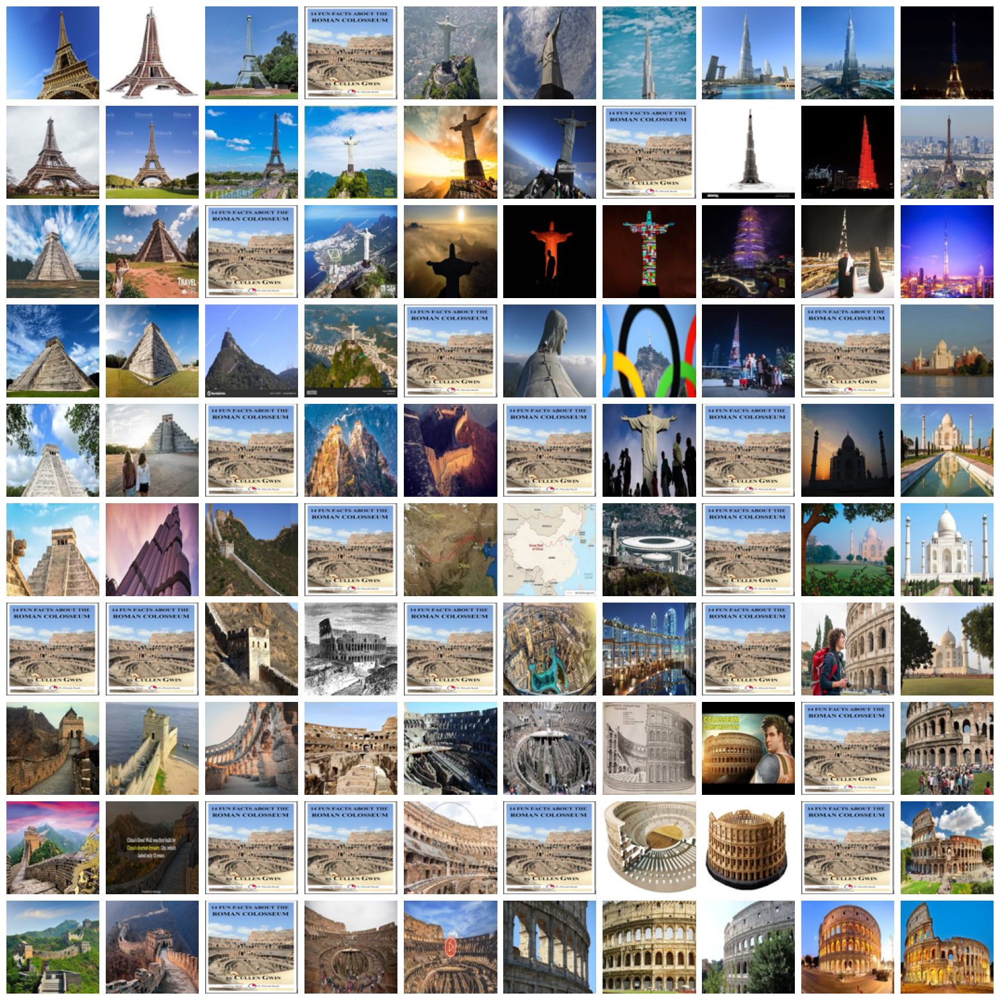

In [155]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import numpy as np

img_arr = []
for image in imageGrid:
    img_arr.append(img_reshape(image))

fig = plt.figure(figsize=(20., 20.))
grid = ImageGrid(fig, 111, 
                 nrows_ncols=(10, 10),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes
                 )

for ax, im in zip(grid, img_arr):
    ax.imshow(im)
    ax.axis('off')
plt.show()

In [156]:
featureImagePairs[0]

{'image': '1.jpg',
 'feature': array([0.27969754, 1.2918435 , 0.82733744, ..., 0.05108447, 0.00511587,
        0.05542929], dtype=float32)}

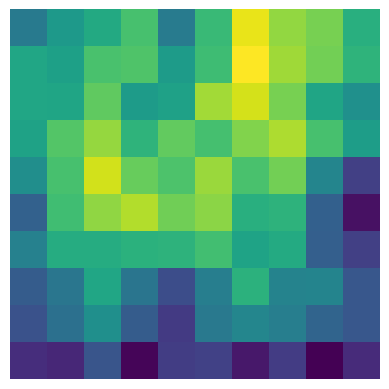

In [157]:
activatedSOM = activate(train_data, SOM, normalise(train_data,featureImagePairs[0]['feature']))
fig = plt.figure()
plt.imshow(activatedSOM)
plt.axis('off')
plt.show()

### 2.0 Write a function with which you can save a trained som using pickle

In [158]:
import pickle

def save_som_model(model, filename):
    if not filename.endswith('.obj'):
        filename += '.obj' 
        
    with open(filename, 'wb') as f:
        pickle.dump(model, f)
    print(f"Model saved as '{filename}'.")

In [159]:
save_som_model(SOM, 'trainedSOM')

Model saved as 'trainedSOM.obj'.


### 3.0 Write a function to load a saved som

In [160]:
def load_som_model(filename):
    with open(filename, 'rb') as f:
        SOM = pickle.load(f)
    print(f"Model loaded from '{filename}'.")
    return SOM

In [161]:
load_som_model('trainedSOM.obj')

Model loaded from 'trainedSOM.obj'.


array([[[0.0117263 , 0.06494023, 0.10269431, ..., 0.15669413,
         0.0812345 , 0.00401894],
        [0.03773989, 0.07947203, 0.18478661, ..., 0.22350842,
         0.09299422, 0.01663301],
        [0.02150311, 0.04530544, 0.21910163, ..., 0.1749768 ,
         0.04393725, 0.01356816],
        ...,
        [0.03150744, 0.11479376, 0.08914655, ..., 0.0956236 ,
         0.0595798 , 0.00641394],
        [0.02011061, 0.14013999, 0.14464027, ..., 0.21486259,
         0.04056981, 0.01439614],
        [0.0231218 , 0.11287129, 0.15475864, ..., 0.29237299,
         0.04864179, 0.03598315]],

       [[0.02406211, 0.06776418, 0.17275669, ..., 0.18703443,
         0.04412275, 0.00332287],
        [0.02805064, 0.12329478, 0.22618076, ..., 0.23036172,
         0.05672997, 0.01271838],
        [0.02056694, 0.09632086, 0.25842242, ..., 0.17403729,
         0.0406798 , 0.0326063 ],
        ...,
        [0.04718919, 0.1267817 , 0.09167827, ..., 0.07686445,
         0.08242236, 0.02029805],
        [0.0

### 4.0 Images that are displayed are in fact the images that are closest to the SOM vector of that particular cell

In [162]:
def distance_between(a, b):
    a = np.asarray(a, dtype=np.float64)
    b = np.asarray(b, dtype=np.float64)
    return np.linalg.norm(a - b)

In [163]:
def find_closest_image_index(distance):
    closest_index = 0
    distance_closest = distance[0]

    for index in range(1, len(distance)):
        if distance[index] < distance_closest:
            distance_closest = distance[index]
            closest_index = index

    return closest_index

In [164]:
def get_closest_image(a,b):
  cell = SOM[a][b]
  distance = [distance_between(cell, i['feature']) for i in SOMimages[a][b]]
  closest_image_index=find_closest_image_index(distance)
  return closest_image_index

In [165]:
from scipy import spatial

imageGrid = []
for g in range(len(SOMimages)):
    row = SOMimages[g]
    for h in range(len(row)):
        cell = row[h]
        if len(cell) > 0:
            closest_image_index=get_closest_image(g,h)
            imageGrid.append(cell[closest_image_index]['image'])
        else:
            imageGrid.append('1.jpg')

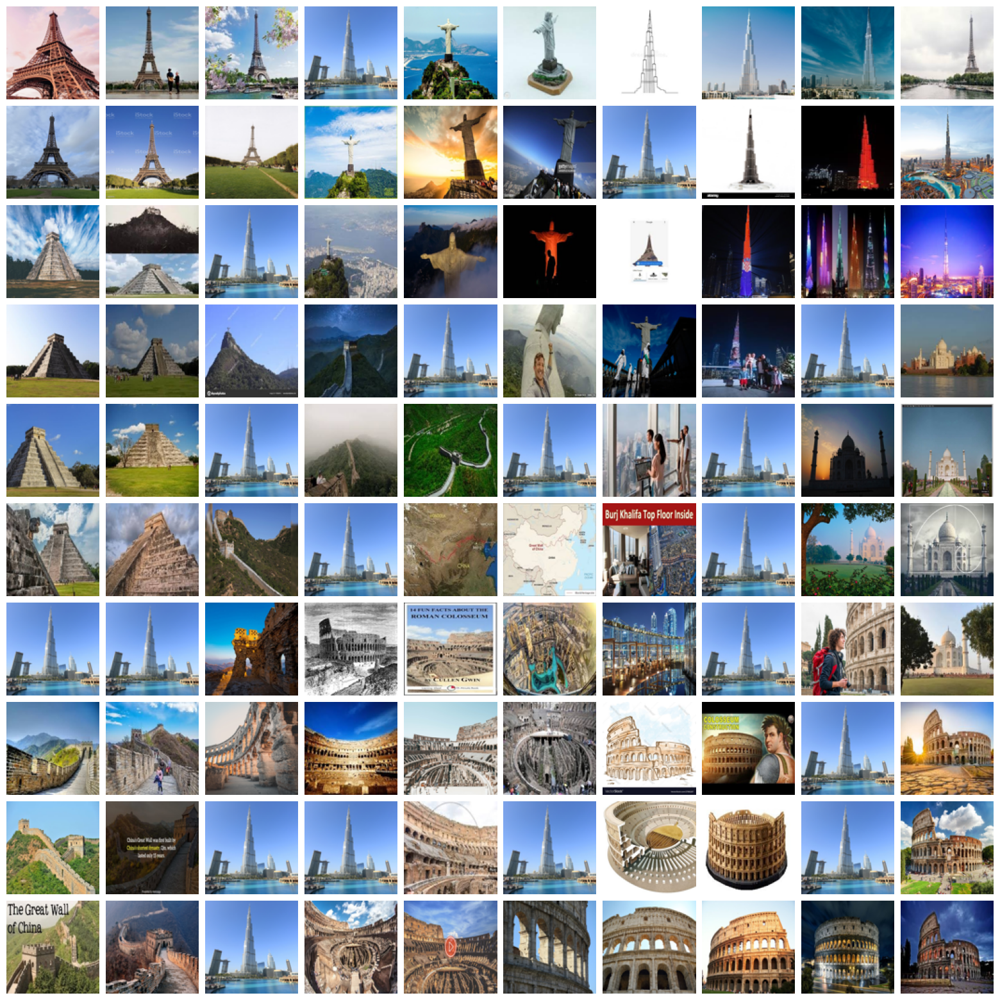

In [166]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import numpy as np

img_arr = []
for image in imageGrid:
    img_arr.append(img_reshape(image))

fig = plt.figure(figsize=(20., 20.))
grid = ImageGrid(fig, 111,
                 nrows_ncols=(10, 10),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes
                 )

for ax, im in zip(grid, img_arr):
    ax.imshow(im)
    ax.axis('off')
plt.show()

In [167]:
def distance_between(a, b):
    a = np.asarray(a, dtype=np.float64)
    b = np.asarray(b, dtype=np.float64)
    return np.linalg.norm(a - b)

def find_closest_image_index(distance):
    closest_index = 0
    distance_closest = distance[0]

    for index in range(1, len(distance)):
        if distance[index] < distance_closest:
            distance_closest = distance[index]
            closest_index = index
    return closest_index

def get_closest_image(a,b):
    cell = SOM[a][b]
    distance = [distance_between(cell, i['feature']) for i in SOMimages[a][b]]
    closest_image_index=find_closest_image_index(distance)
    return closest_image_index

In [168]:
imageGrid = []
for g in range(len(SOMimages)):
    row = SOMimages[g]
    for h in range(len(row)):
        cell = row[h]
        if len(cell) > 0:
            closest_image_index=get_closest_image(g,h)
            imageGrid.append(cell[closest_image_index]['image'])
        else:
            imageGrid.append('1.jpg')

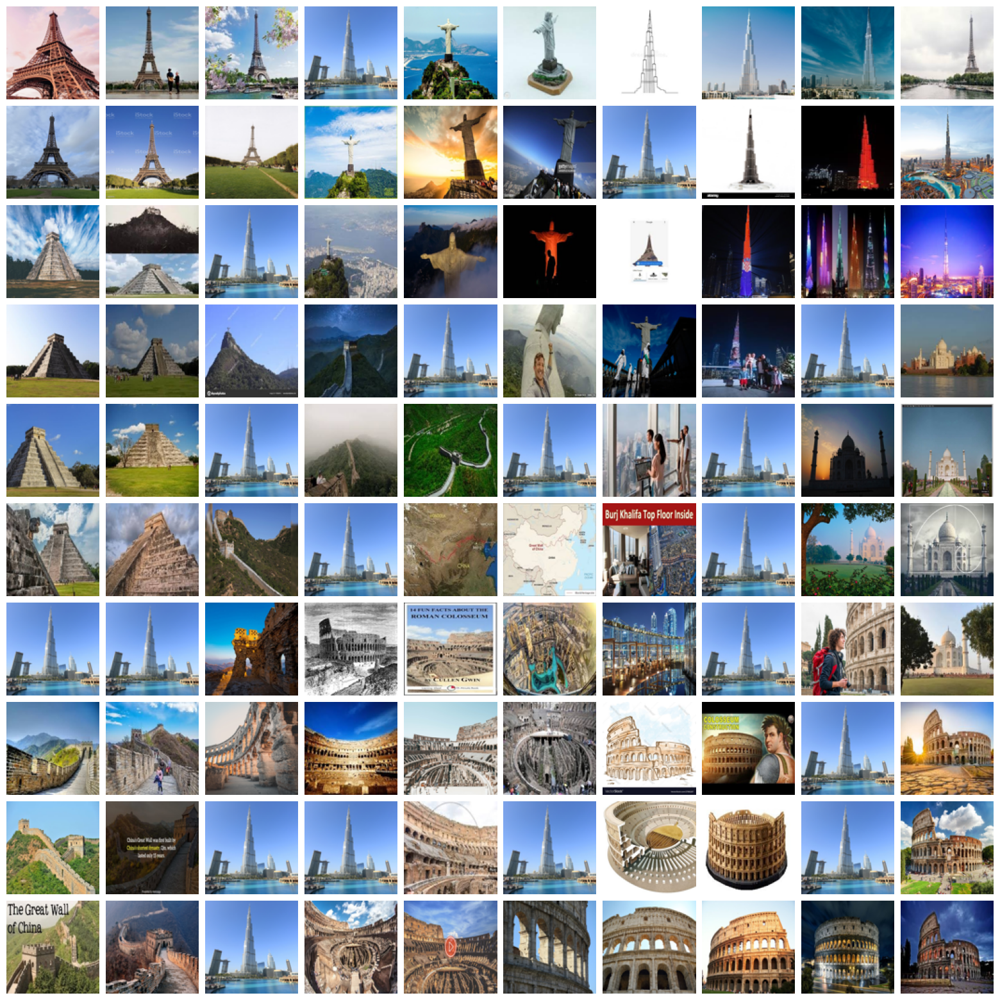

In [169]:
img_arr = []
for image in imageGrid:
    img_arr.append(img_reshape(image))

fig = plt.figure(figsize=(20., 20.))
grid = ImageGrid(fig, 111,
                 nrows_ncols=(10, 10),  
                 axes_pad=0.1,  
                 )

for ax, im in zip(grid, img_arr):
    ax.imshow(im)
    ax.axis('off')
plt.show()

### 5.0 Write a function that returns a grid of images where each image is the closest image from the training data set to that cell in the SOM.

In [170]:
def get_closest_image_all(a,b):
    cell = SOM[a][b]
    distance = [distance_between(cell, normalise(train_data,i['feature'])) for i in featureImagePairs]
    closest_image_index=find_closest_image_index(distance)
    return closest_image_index

In [171]:
imageGrid = []
for g in range(len(SOMimages)):
    row = SOMimages[g]
    for h in range(len(row)):
        cell = row[h]
        if len(cell) > 0:
            closest_image_index=get_closest_image_all(g,h)
            imageGrid.append(featureImagePairs[closest_image_index]['image'])
        else:
            imageGrid.append('1.jpg')

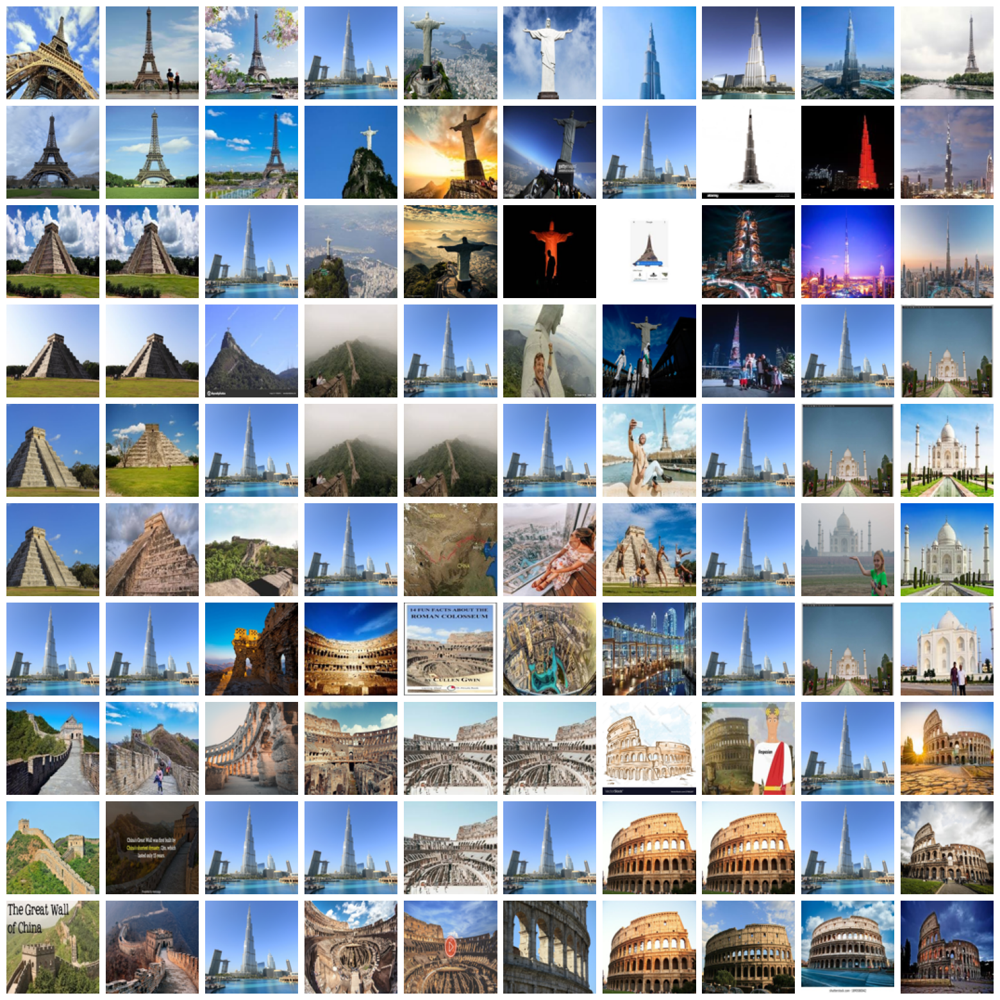

In [172]:
img_arr = []
for image in imageGrid:
    img_arr.append(img_reshape(image))

fig = plt.figure(figsize=(20., 20.))
grid = ImageGrid(fig, 111,
                 nrows_ncols=(10, 10), 
                 axes_pad=0.1,  
                 )

for ax, im in zip(grid, img_arr):
    ax.imshow(im)
    ax.axis('off')
plt.show()

### 6.0 Make a function to visualise a uMatrix using your own colour gradient.

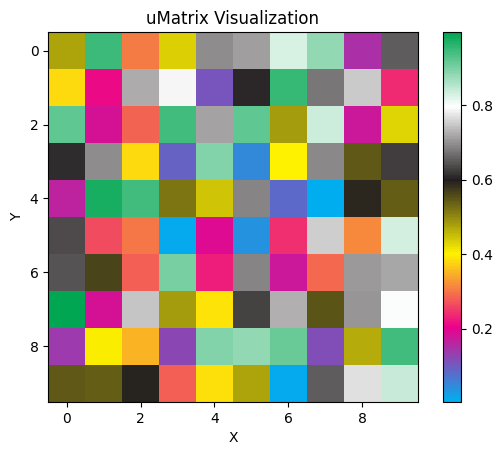

In [173]:
def visualize_uMatrix(uMatrix):

    colors = [(0, "#00AEEF"), (0.2, "#EC008C"), (0.4, "#FFF200"), (0.6, "#231F20"), (.8, "#FFFFFF"), (1, "#00A651")]
    cmap = plt.cm.colors.LinearSegmentedColormap.from_list("", colors)

    plt.imshow(uMatrix, cmap=cmap)
    plt.colorbar()
    plt.title('uMatrix Visualization')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.show()

uMatrix = np.random.rand(10, 10)

visualize_uMatrix(uMatrix)

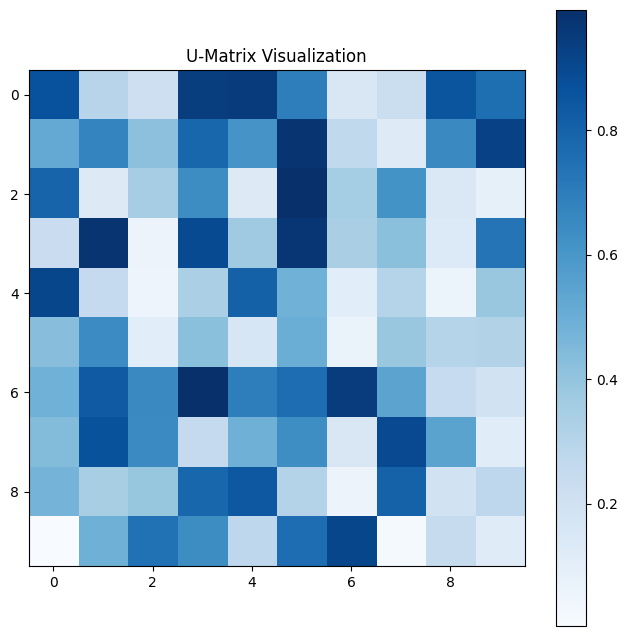

In [174]:
def visualize_umatrix(umatrix):

    plt.figure(figsize=(8, 8))
    plt.imshow(umatrix, cmap='Blues', interpolation='nearest')
    plt.colorbar()
    plt.title('U-Matrix Visualization')
    plt.show()

umatrix = np.random.rand(10, 10)
visualize_umatrix(umatrix)


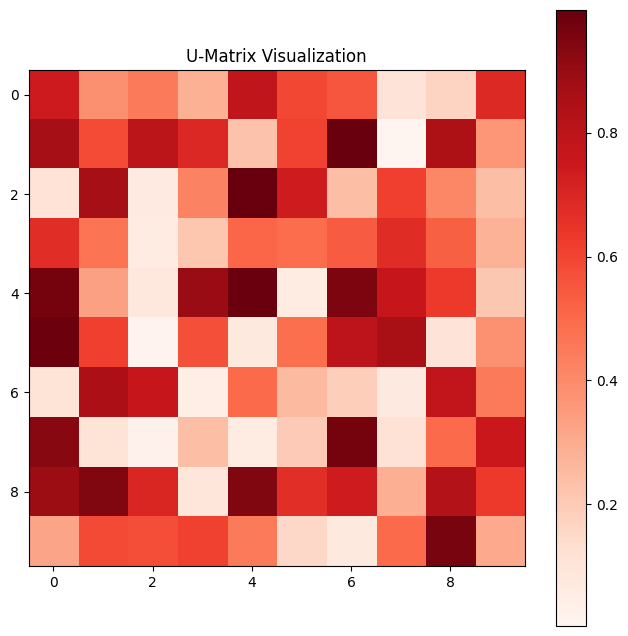

In [175]:
def visualize_umatrix(umatrix):

    plt.figure(figsize=(8, 8))
    plt.imshow(umatrix, cmap='Reds', interpolation='nearest')
    plt.colorbar()
    plt.title('U-Matrix Visualization')
    plt.show()

umatrix = np.random.rand(10, 10)
visualize_umatrix(umatrix)


### 7.0 Train a SOM with a different way of vectorising a dataset, this could be text using TF-IDF, or any other alternative which which you can encode a dataset into a numerical vector. The vectors should have at least 4 dimensions.

In [176]:
from nltk.corpus import words, stopwords, names
from nltk.stem import PorterStemmer
from nltk.stem import WordNetLemmatizer
import gensim
import enchant
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity


In [177]:
with open('../../../Text/240217/The Anarchist Library Search/paragraphs.obj', 'rb') as pickleFile:
    paragraphs = pickle. load(pickleFile)

with open('../../../Text/240217/The Anarchist Library Search/preprocessed.obj', 'rb') as pickleFile:
    preprocessed = pickle. load(pickleFile)

In [178]:
preprocessed_Joined = " ".join(preprocessed)

In [193]:
len(preprocessed_Joined)

324694129

In [179]:
vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform([preprocessed_Joined])
feature_names = vectorizer.get_feature_names_out()

In [195]:
top_indices = tfidf_matrix.toarray()[0].argsort()[-2000:]
selected_words = [feature_names[i] for i in top_indices]

In [191]:
import tensorflow_hub as hub

model_url = "https://www.kaggle.com/models/google/wiki-words/frameworks/TensorFlow2/variations/250/versions/1"
model = hub.KerasLayer(model_url)


In [198]:
word_vectors = [model([feature_names]).numpy().squeeze(0) for feature_names in selected_words]

In [200]:
feature_Text = []
for i in range(len(word_vectors)):
    featureText = {}
    featureText['text'] = selected_words[i]
    featureText['feature'] = word_vectors[i]
    feature_Text.append(featureText)

In [201]:
len(feature_Text)

2000

In [203]:
feature_Text[0]['feature'].shape

(250,)

##### Phase 2.0

In [205]:
m = 10
n = 10
# Number of training examples
n_x = 2000
rand = np.random.RandomState(0)
# Initialize the training data
train_data = word_vectors

# Initialize the SOM randomly
SOM = rand.uniform(0, 1, (m, n, train_data[0].shape[0]))

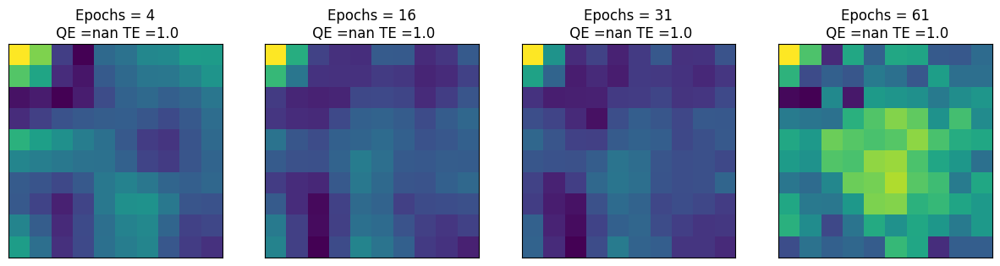

In [208]:
fig, ax = plt.subplots(
    nrows=1, ncols=4, figsize=(15, 3.5), 
    subplot_kw=dict(xticks=[], yticks=[]))
total_epochs = 0
SOMS = []
for epochs, i in zip([4, 12, 15, 30], range(0,4)):
    total_epochs += epochs
    SOM = train_SOM(SOM, train_data, learn_rate = .1, radius_sq = 2, epochs = epochs)
    SOMS.append(SOM)
    QE = round(calculateQE(SOM, train_data), 4)
    TE = round(calculateTE(SOM, train_data), 4)
    
    ax[i].imshow(u_matrix(SOM))
    ax[i].title.set_text('Epochs = ' + str(total_epochs) + '\n QE =' + str(QE) + ' TE =' + str(TE))

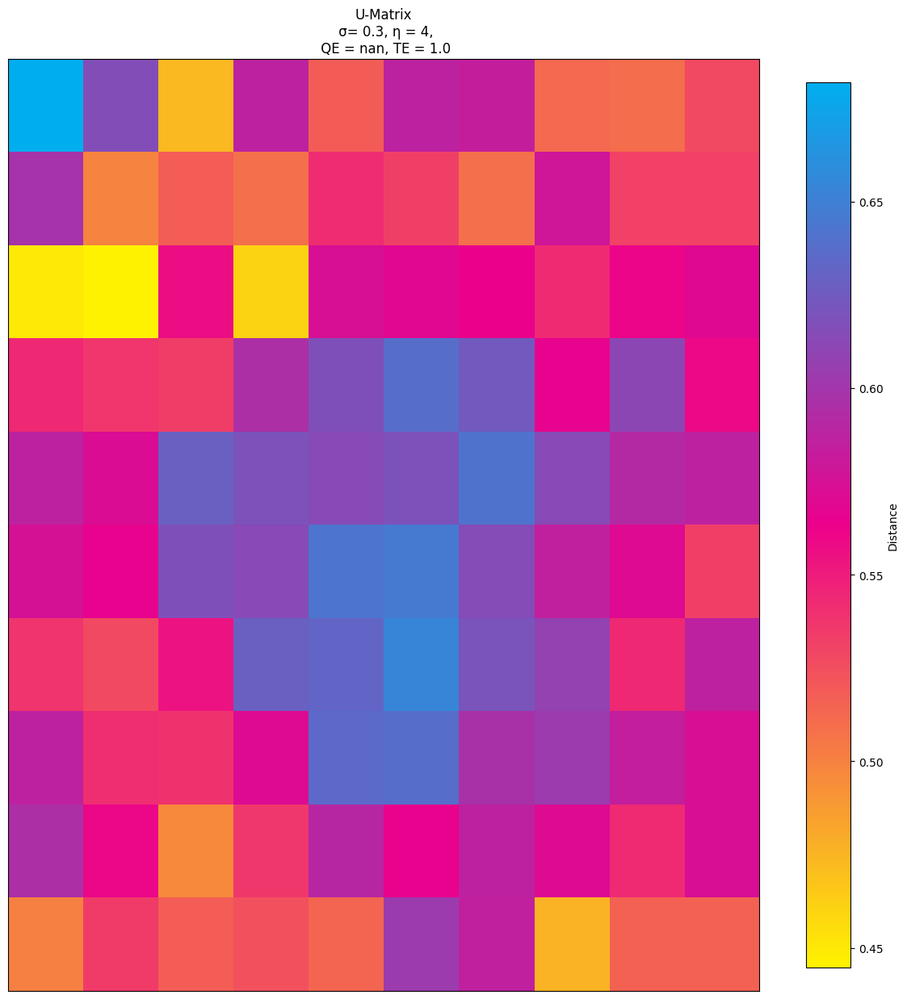

In [212]:
u_matrix_values = u_matrix(SOM)                     
QE = round(calculateQE(SOM, train_data), 4)         
TE = round(calculateTE(SOM, train_data), 4)         

plt.figure(figsize=(15, 15))                        
colors = [
        (0, "#FFF200"),  
        (0.5, "#EC008C"),  
        (1, "#00AEEF"), 
    ] 
cmap = LinearSegmentedColormap.from_list('custom_cmap', colors)
im = plt.imshow(u_matrix_values, cmap=cmap, aspect='auto')
plt.title(f'U-Matrix\n σ= {0.3}, η = {4},\n QE = {QE}, TE = {TE}')
plt.colorbar(im, shrink=0.95, label='Distance')
plt.xticks([])
plt.yticks([]) 
plt.show()

In [213]:
neuron_word_mapping = { (i,j) : [] for i in range(SOM.shape[0]) for j in range(SOM.shape[1]) }

for item in feature_Text:
    word, vector = item['text'], item['feature']
    bmu = find_BMU(SOM, vector)
    neuron_word_mapping[bmu].append(word)

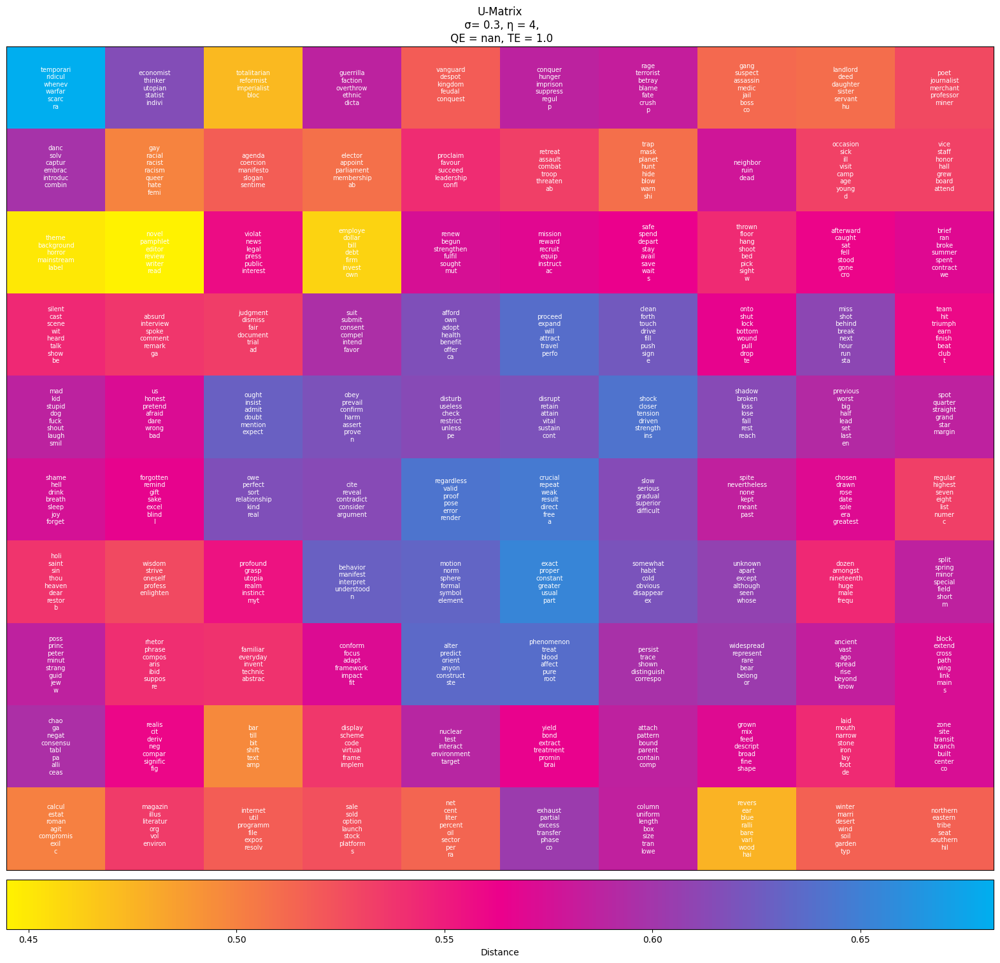

In [214]:
plt.figure(figsize=(20, 20))
im = plt.imshow(u_matrix_values, cmap=cmap, aspect='auto')
plt.title(f'U-Matrix\n σ= {0.3}, η = {4},\n QE = {QE}, TE = {TE}')
plt.colorbar(im, orientation='horizontal', label='Distance', pad=0.01)

for (i, j), words in neuron_word_mapping.items():
    text = '\n'.join(words)[:40]
    plt.text(j, i, text, ha='center', va='center', color='white', fontsize=7)

plt.xticks([])
plt.yticks([])
plt.show()